<a href="https://colab.research.google.com/github/melcutz/Covid19Study/blob/master/SEIR_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
! pip install seirsplus

  Created wheel for seirsplus: filename=seirsplus-0.0.14-cp36-none-any.whl size=14320 sha256=54f35fa479a1abc4a057543dc6c3da2d64444af14ae9d9f7e48f409575247e16
  Stored in directory: /root/.cache/pip/wheels/b9/46/12/112ee3188b6f523d63d60e5a5fd4ed5be80195b4c198d57f91
Successfully built seirsplus


In [0]:
from seirsplus.models import *

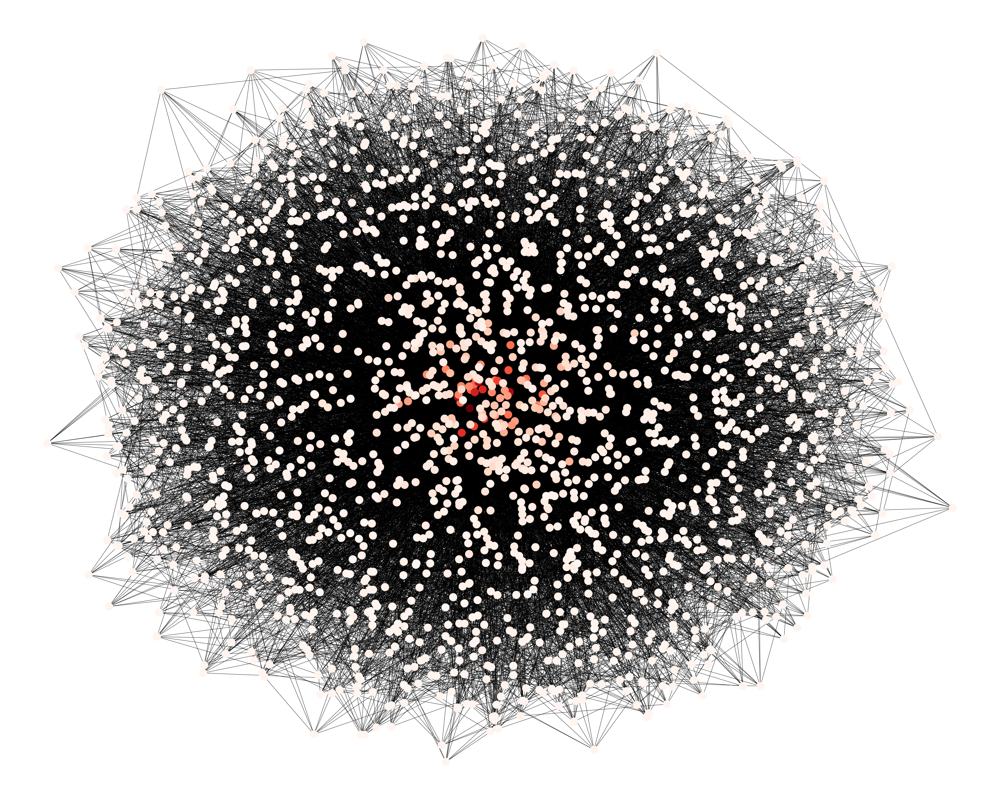

In [45]:
import matplotlib.pyplot as plt
import networkx as nx

def plot_graph(g):
  plt.rcParams["figure.figsize"] = (50,40)
  degs = []
  for node in g.nodes:
    degs.append(g.degree[node])
  # print(degs)
  pos = nx.spring_layout(g, iterations=20)
  nx.draw(g, pos, node_color=degs, node_size=800, alpha=1, cmap=plt.cm.Reds)
  plt.show( )

numNodes = 2000
baseGraph    = nx.barabasi_albert_graph(n=numNodes, m=9)
plot_graph(baseGraph)

baseGraph Nodes: 2000
baseGrpah edges: 17919
G_normal nodes:  2000
G_normal edges:  12918


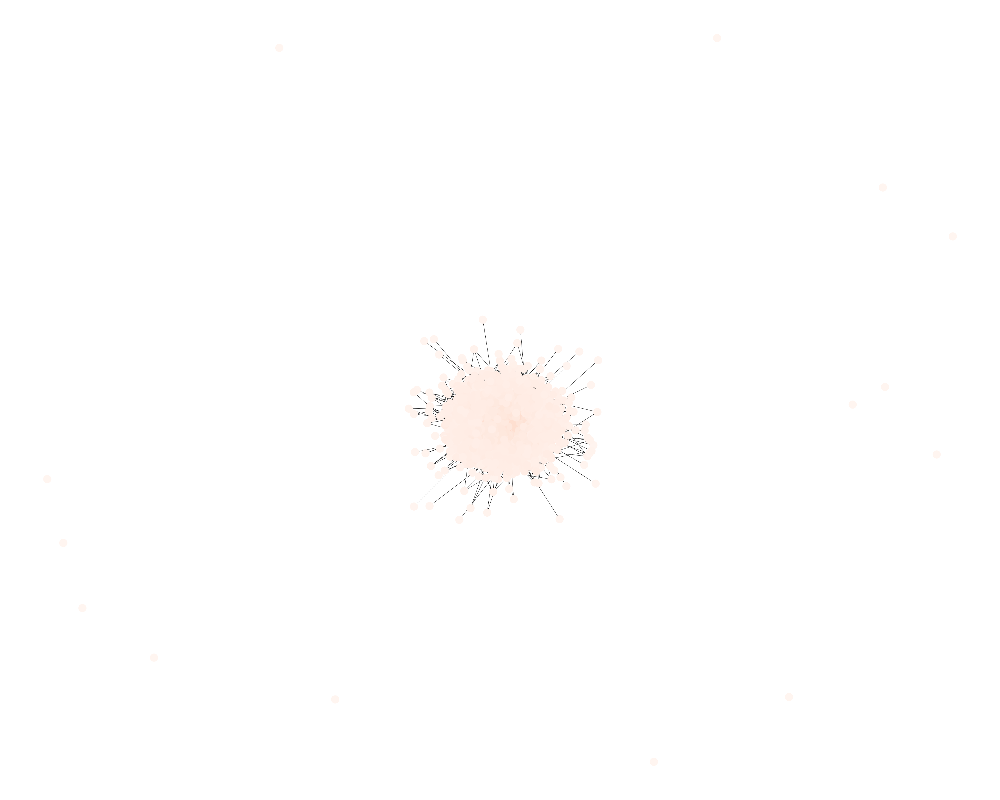

G_distancing nodes:  2000
G_distancing edges:  4115


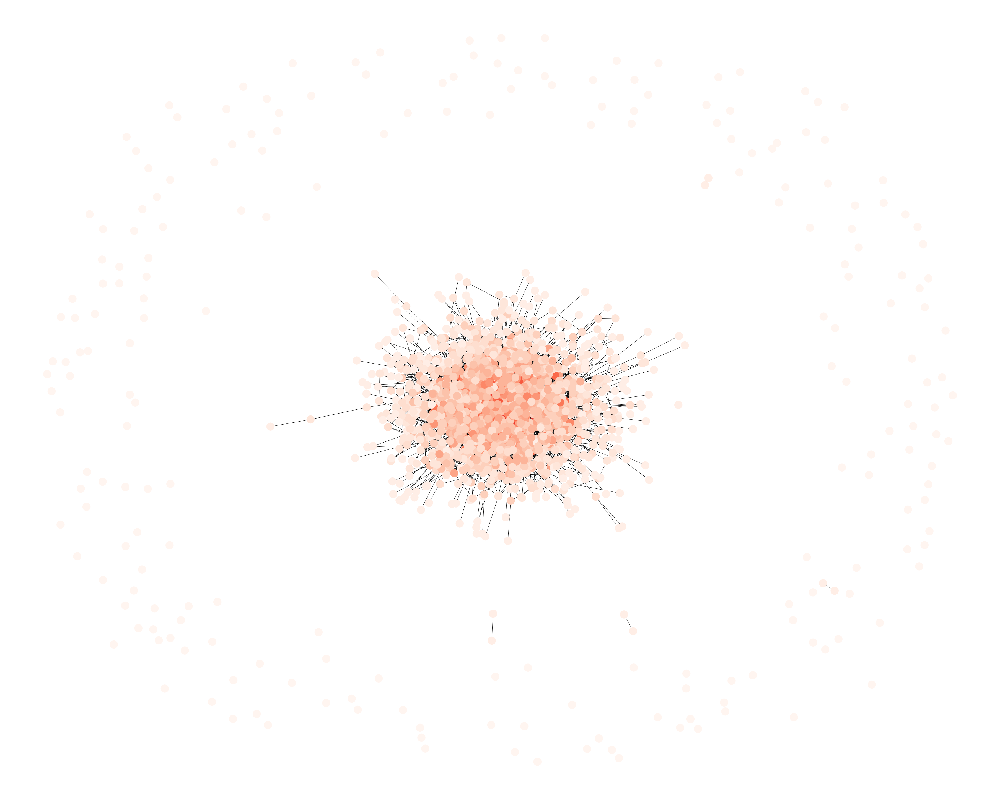

G_quarantine nodes:  2000
G_quarantine edges:  158


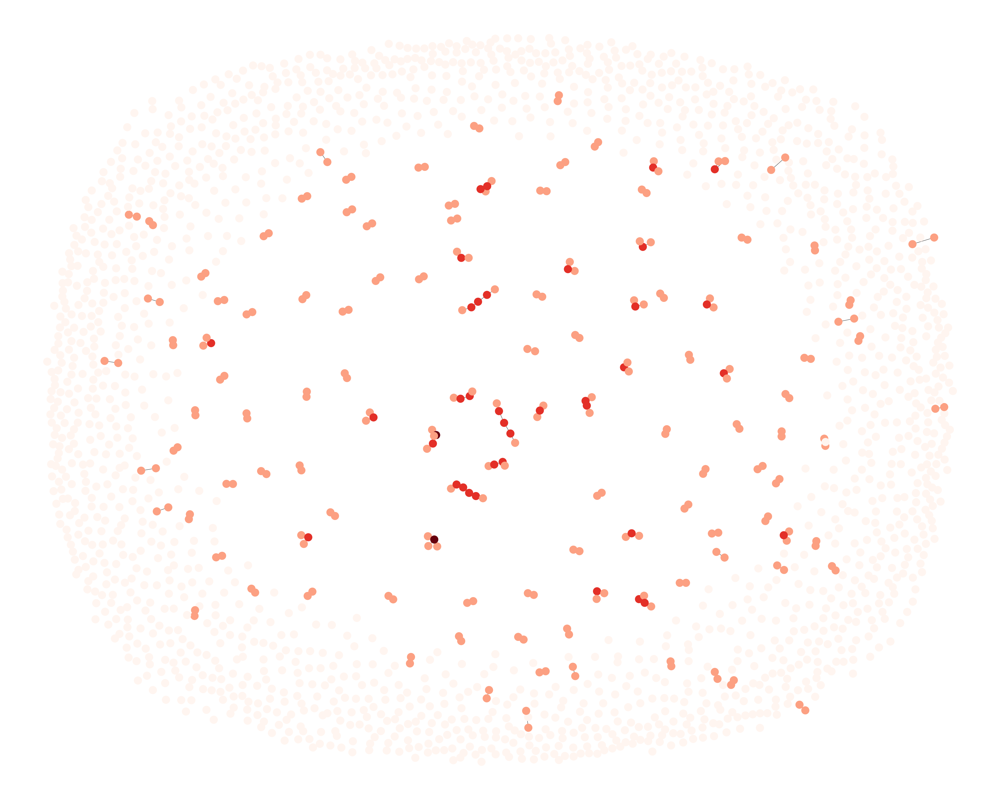

In [53]:
print('baseGraph Nodes:', len(baseGraph.nodes))
print('baseGrpah edges:', len(baseGraph.edges))

G_normal     = custom_exponential_graph(baseGraph, scale=100)
print('G_normal nodes: ', len(G_normal.nodes))
print('G_normal edges: ', len(G_normal.edges))
plot_graph(G_normal)
# # Social distancing interactions:
G_distancing = custom_exponential_graph(baseGraph, scale=10)
print('G_distancing nodes: ', len(G_distancing.nodes))
print('G_distancing edges: ', len(G_distancing.edges))
plot_graph(G_distancing)

# # Quarantine interactions:
G_quarantine = custom_exponential_graph(baseGraph, scale=1)
print('G_quarantine nodes: ', len(G_quarantine.nodes))
print('G_quarantine edges: ', len(G_quarantine.edges))
plot_graph(G_quarantine)



t = 0.43
t = 10.20
[Checkpoint: Updating parameters]
t = 20.02
t = 30.06
t = 40.02
t = 50.07
t = 60.00
t = 70.11
t = 80.02
t = 90.03
t = 100.01
t = 110.04
t = 120.08
t = 130.02
t = 140.11
t = 150.00
t = 160.02
t = 170.02
t = 180.17
t = 190.35
t = 200.24
t = 210.08
t = 220.73
t = 230.30
t = 240.79
t = 260.72
t = 290.56


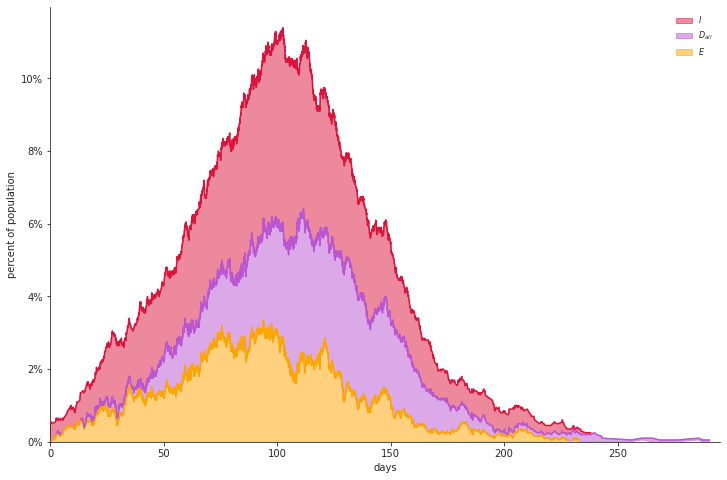

In [89]:
model = SEIRSNetworkModel(G=G_normal, beta=0.155, sigma=1/5.2, gamma=1/12.39, mu_I=0.0004, p=0.5,
                          Q=G_quarantine, beta_D=0.155, sigma_D=1/5.2, gamma_D=1/12.39, mu_D=0.0004,
                          theta_E=0.02, theta_I=0.02, phi_E=0.2, phi_I=0.2, psi_E=1.0, psi_I=1.0, q=0.5,
                          initI=10)

checkpoints = {'t': [20, 1000], 'G': [G_distancing, G_normal], 'p': [0.9, .1], 'theta_E': [0.02, 0.02], 'theta_I': [0.02, 0.02], 'phi_E':   [0.2, 0.2], 'phi_I':   [0.2, 0.2]}
# checkpoints={}
model.run(T=300, checkpoints=checkpoints,verbose=False)
model.figure_infections()